In [2]:
import cv2
import numpy as np
from scipy.ndimage import generic_filter
import matplotlib.pyplot as plt
plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-dark.mplstyle')

In [3]:
# Load the image
image_path = "noise.png"
image = cv2.imread(image_path, 0)  # Load as grayscale image

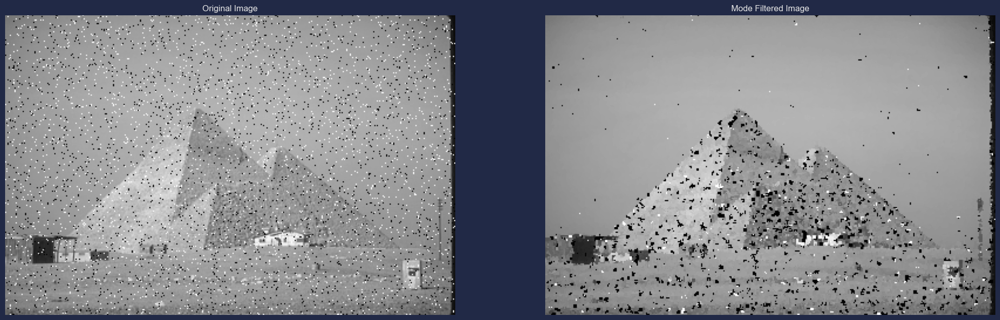

In [4]:
def mode_filter(arr):
    arr = arr.astype(int)
    return np.bincount(arr).argmax()



mode_filtered_image = generic_filter(image, mode_filter, size=(3, 3))

fig, axes = plt.subplots(1, 2, figsize=(25, 8))

axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(mode_filtered_image, cmap='gray')
axes[1].set_title('Mode Filtered Image')
axes[1].axis('off')

plt.show()

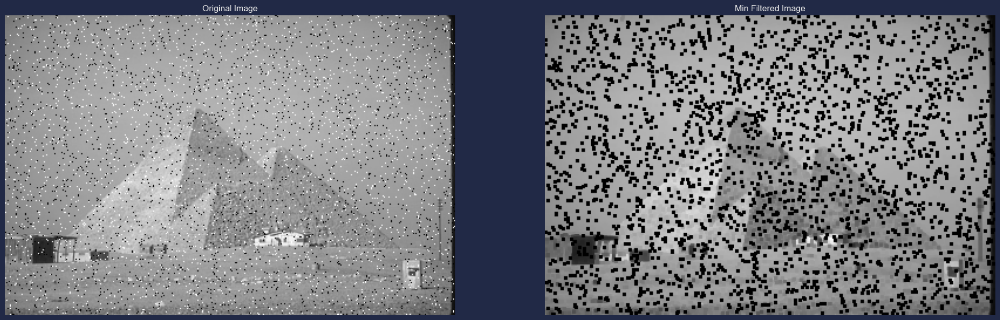

In [5]:
def min_filter(arr):
    return np.min(arr)

min_filtered_image = generic_filter(image, min_filter, size=(3, 3))

fig, axes = plt.subplots(1, 2, figsize=(25, 8))

# Original Image
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Min Filtered Image
axes[1].imshow(min_filtered_image, cmap='gray')
axes[1].set_title('Min Filtered Image')
axes[1].axis('off')

plt.show()

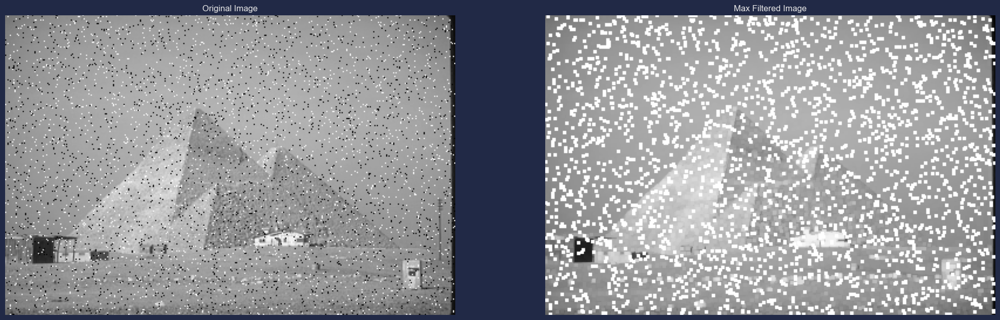

In [6]:
def max_filter(arr):
    return np.max(arr)


max_filtered_image = generic_filter(image, max_filter, size=(3, 3))

fig, axes = plt.subplots(1, 2, figsize=(25, 8))

# Original Image
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Max Filtered Image
axes[1].imshow(max_filtered_image, cmap='gray')
axes[1].set_title('Max Filtered Image')
axes[1].axis('off')

plt.show()

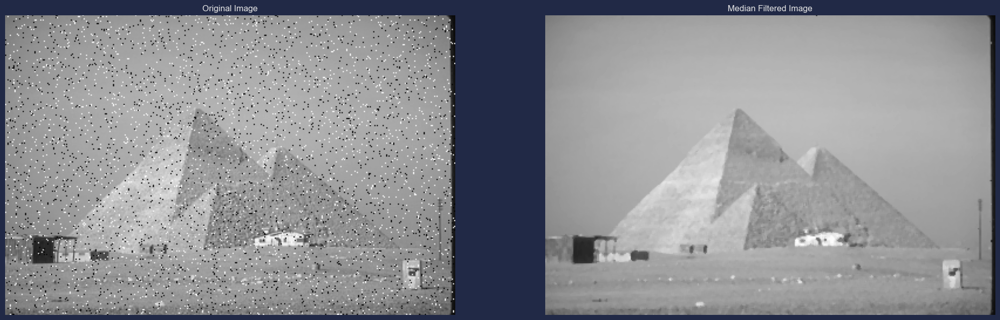

In [7]:
from scipy.ndimage import median_filter 

# Apply the median filter
median_filtered_image = median_filter(image, size=(3, 3))

plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(median_filtered_image, cmap='gray')
plt.title('Median Filtered Image')
plt.axis('off')

plt.show()

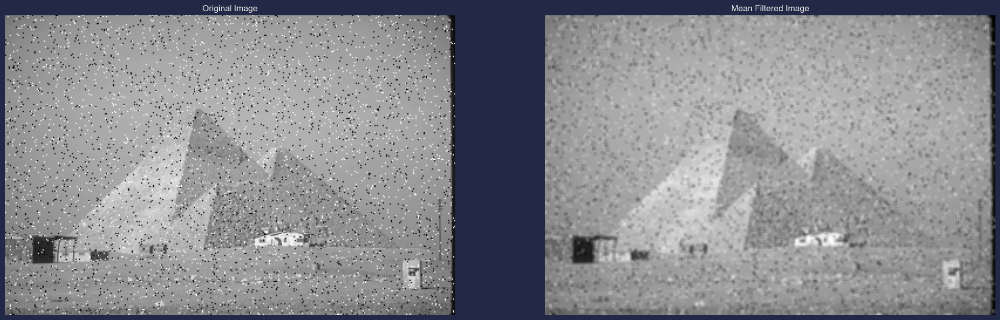

In [8]:
def mean_filter(arr):
    return np.mean(arr)

# Apply the mean filter
mean_filtered_image = generic_filter(image, mean_filter, size=(3, 3))


plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mean_filtered_image, cmap='gray')
plt.title('Mean Filtered Image')
plt.axis('off')

plt.show()

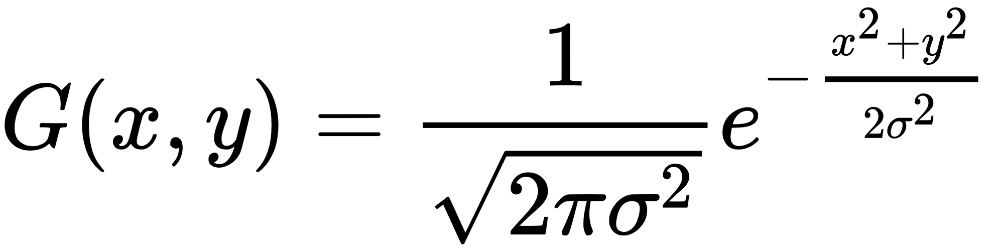

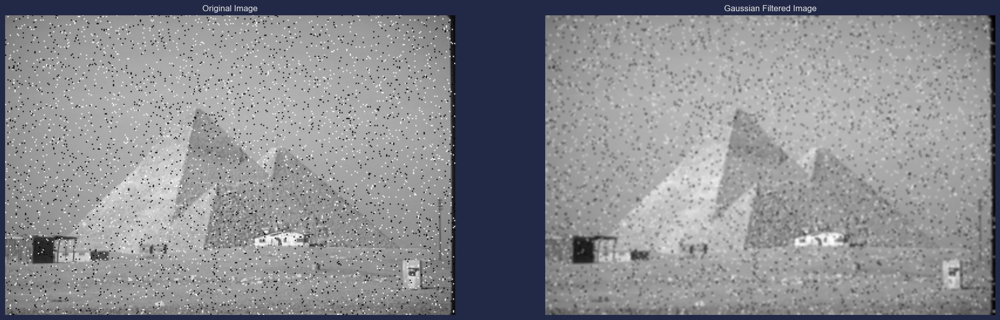

In [9]:
gaussian_filtered_image = cv2.GaussianBlur(image, (3, 3), 0) # *0=> sigma

plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gaussian_filtered_image, cmap='gray')
plt.title('Gaussian Filtered Image')
plt.axis('off')

plt.show()

# Edge detection

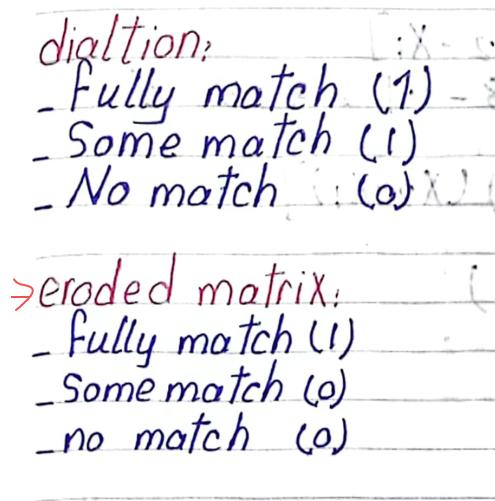

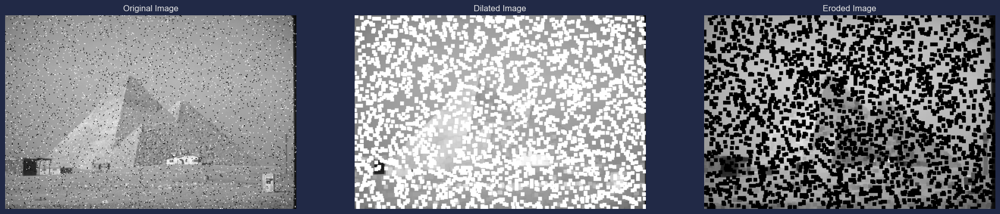

In [10]:
# Define the kernel for morphology operations
kernel = np.ones((5, 5), np.uint8)

dilated_image = cv2.dilate(image, kernel, iterations=1)

eroded_image = cv2.erode(image, kernel, iterations=1)

plt.figure(figsize=(25, 8))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(dilated_image, cmap='gray')
plt.title('Dilated Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(eroded_image, cmap='gray')
plt.title('Eroded Image')
plt.axis('off')

plt.show()

`cv2.filter2D` Function
The cv2.filter2D function in OpenCV is used to apply a convolution filter `(kernel)` to an image. It performs a 2D spatial convolution between the input image and the kernel.

Parameters:

- `image`
- `-1`: Output image depth. Use `-1` to indicate that the output image depth should be the same as the input image depth.
- `kernel`

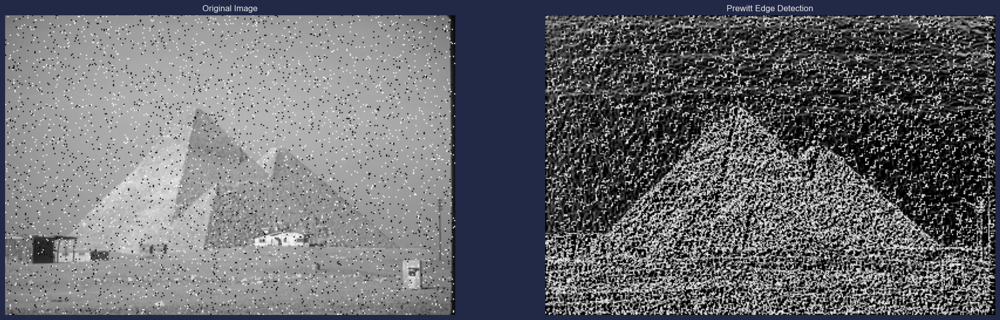

In [11]:
def prewitt_edge_detection(image):
    prewitt_kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    prewitt_kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])
    prewitt_edges_x = cv2.filter2D(image, -1, prewitt_kernel_x)   #* prewitt_kernel_x * imd 
    prewitt_edges_y = cv2.filter2D(image, -1, prewitt_kernel_y)
    prewitt_edges = np.sqrt(np.square(prewitt_edges_x) + np.square(prewitt_edges_y))
    return prewitt_edges

prewitt_edges = prewitt_edge_detection(image)

plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(prewitt_edges, cmap='gray')
plt.title('Prewitt Edge Detection')
plt.axis('off')

plt.show()

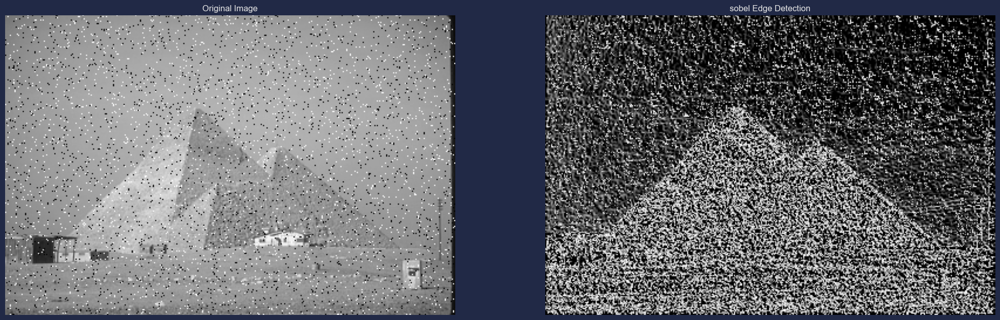

In [19]:
# sobel

def sobel_edge_detection(image):
    sobel_kernel_x =np.array([[-1,0,1], [-2,0,2], [-1, 0, 1]])
    sobel_kernel_y = np.array([[1,2,1], [0,0,0], [-1, -2, -1]])
    sobel_edges_x = cv2.filter2D(image, -1, sobel_kernel_x)   #* sobel_kernel_x * imd 
    sobel_edges_y = cv2.filter2D(image, -1, sobel_kernel_y)
    sobel_edges = np.sqrt(np.square(sobel_edges_x) + np.square(sobel_edges_y))
    return sobel_edges

# Apply sobel edge detection
sobel_edges = sobel_edge_detection(image)

 
plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_edges, cmap='gray')
plt.title('sobel Edge Detection')
plt.axis('off')

plt.show()

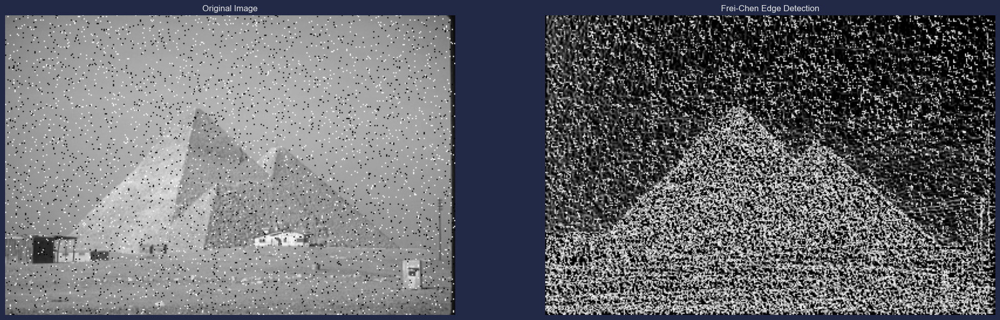

In [14]:
def frei_chen_edge_detection(image):
    frei_chen_kernel_x = np.array([[1, np.sqrt(2), 1], [0, 0, 0], [-1, -np.sqrt(2), -1]])
    frei_chen_kernel_y = np.array([[-1, 0, 1], [-np.sqrt(2), 0, np.sqrt(2)], [-1, 0, 1]])
    frei_chen_edges_x = cv2.filter2D(image, -1, frei_chen_kernel_x)
    frei_chen_edges_y = cv2.filter2D(image, -1, frei_chen_kernel_y)
    frei_chen_edges = np.sqrt(np.square(frei_chen_edges_x) + np.square(frei_chen_edges_y))
    return frei_chen_edges

frei_chen_edges = frei_chen_edge_detection(image)

 
plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(frei_chen_edges, cmap='gray')
plt.title('Frei-Chen Edge Detection')
plt.axis('off')

plt.show()

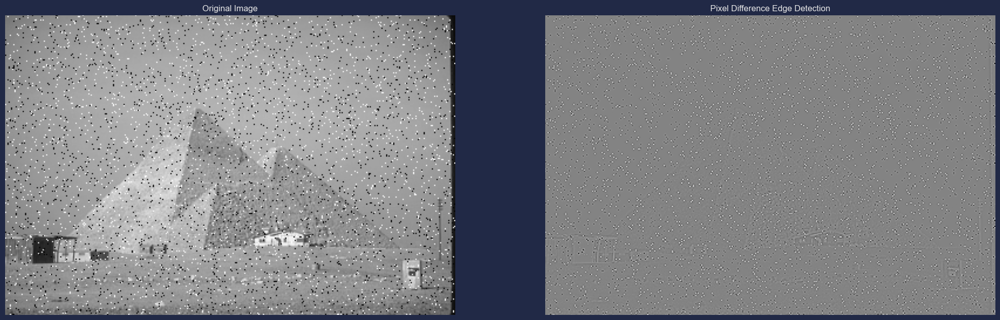

In [17]:
def pixel_diff_edge_detection(image):
    pixel_diff_edges = cv2.Laplacian(image, cv2.CV_64F)
    return pixel_diff_edges

pixel_diff_edges = pixel_diff_edge_detection(image)

 
plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(pixel_diff_edges, cmap='gray')
plt.title('Pixel Difference Edge Detection')
plt.axis('off')

plt.show()

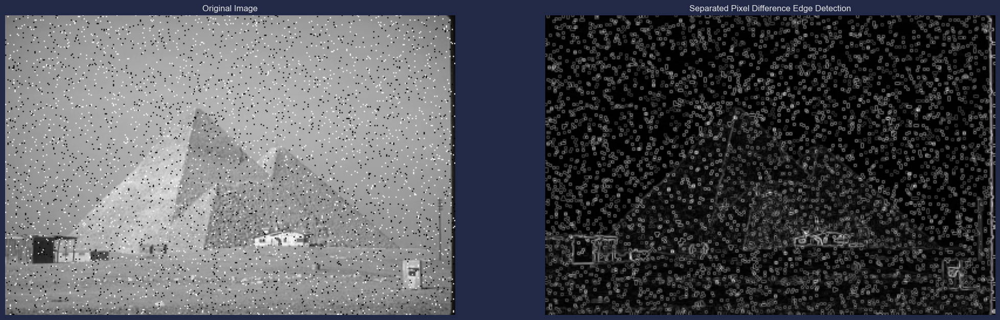

In [18]:
def sep_pixel_diff_edge_detection(image):
    sep_pixel_diff_edges_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sep_pixel_diff_edges_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sep_pixel_diff_edges = np.sqrt(np.square(sep_pixel_diff_edges_x) + np.square(sep_pixel_diff_edges_y))
    return sep_pixel_diff_edges

sep_pixel_diff_edges = sep_pixel_diff_edge_detection(image)



plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sep_pixel_diff_edges, cmap='gray')
plt.title('Separated Pixel Difference Edge Detection')
plt.axis('off')

plt.show()